In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
from tqdm.notebook import trange, tqdm
from IPython.display import Image, display, Markdown, clear_output
from zipfile import ZipFile
import os
import cv2
import pandas as pd
import numpy as np

In [3]:
zip_dir_loc='/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images'

The names of the files

In [4]:
raw_img_file_names = [os.path.join(zip_dir_loc,i) for i in os.listdir(zip_dir_loc)]
raw_img_file_names[:5]

['/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00158.jpg',
 '/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00098.jpg',
 '/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00079.jpg',
 '/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00077.jpg',
 '/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00122.jpg']

Reading images

In [5]:
img_list = []
for imgs in tqdm(raw_img_file_names):
  tst_img = cv2.imread(imgs)
  img_list.append(tst_img)
img_list = np.array(img_list)
display(Markdown(f"#### {img_list.shape}"))

  0%|          | 0/1091 [00:00<?, ?it/s]

#### (1091, 600, 600, 3)

Viewing images

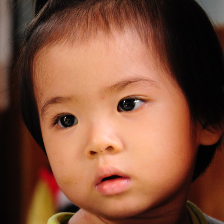

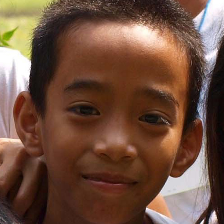

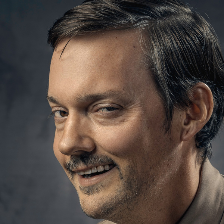

In [6]:
from google.colab.patches import cv2_imshow

for i in img_list[:3,]:
  cv2_imshow(cv2.resize(i,(224,224)))

Bounding boxe function

In [7]:
def Bounding_box(df,fname,title=""):

  tst_img = cv2.imread(fname)
  temp_df = df[df['Image_Name'] == fname]
  rect_img = []
  for rows in temp_df.index:
    x = df['x'][rows]
    y = df['y'][rows]
    w = df['w'][rows]
    h = df['h'][rows]
    cv2.rectangle(tst_img,(x,y),(x+w,y+h),(255,0,0),2)
    cv2.putText(tst_img, title, (int((x+w)*0.75),y-3),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,255))
  cv2_imshow(tst_img)
  
  return

Defining a function to read images and resize them

In [8]:
def show_face(img_list,scale=1.0):

  for imgs in img_list:
    img = cv2.imread(imgs)
    img_w  = int(img.shape[1]*scale)
    img_h = int(img.shape[0]*scale)
    img = cv2.resize(img,(img_w,img_h))
    display(Markdown(f"#### {imgs}"))
    cv2_imshow(img)

  return

Downloading the HAAR Model

In [9]:
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

--2021-12-15 14:16:05--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.04s   

2021-12-15 14:16:05 (19.8 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]



In [10]:
haar_img_box_df = pd.DataFrame(columns=['x','y','w','h','Total_Faces','Image_Name'])
haar_img_box_df

,x,y,w,h,Total_Faces,Image_Name


Detecting Faces using HAAR Model

In [11]:
raw_img_file_names[2]

'/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00079.jpg'

### Bounding Box parameters are `x`:40, `y`:138, `width`:408, `height`:408

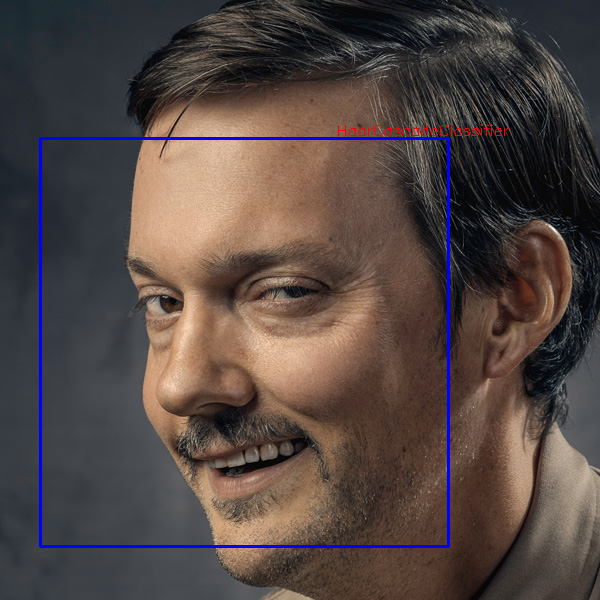

In [12]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

test_img = cv2.imread(raw_img_file_names[2])
grey = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
# Detect faces
faces = face_cascade.detectMultiScale(grey,1.1,4)
# Draw rectangle around the faces
for (x, y, w, h) in faces:
  cv2.rectangle(test_img, (x, y), (x+w, y+h), (255, 0, 0), 2)
  cv2.putText(test_img, "HaarCascadeClassifier", (int((x+w)*0.75),y-3),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,255))

# Display the output
display(Markdown(f"### Bounding Box parameters are `x`:{x}, `y`:{y}, `width`:{w}, `height`:{h}"))
cv2_imshow(test_img)

Detecting faces for all the images

In [13]:
%%time
haar_undetected_images = []
haar_detected_images = []

for imgs, fnames in tqdm(zip(img_list,raw_img_file_names)):
  gray = cv2.cvtColor(imgs,cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray,1.1,4)
  if len(faces) == 0:
    haar_undetected_images.append(fnames)
    temp_dict = {'x':0, 
                 'y':0, 
                 'w':-1,
                 'h':-1, 
                 'Total_Faces':0,
                 'Image_Name':fnames} 
  else:
    haar_detected_images.append(fnames)
    for (x,y,w,h) in faces:
      temp_dict = {'x':x, 
                  'y':y, 
                  'w':w,
                  'h':h, 
                  'Total_Faces':len(faces),
                  'Image_Name':fnames} 
      haar_img_box_df = haar_img_box_df.append(temp_dict,ignore_index=True)
display(Markdown(f"#### Detected faces for {len(haar_detected_images)} images"))
display(Markdown(f"#### Failed to detect faces for {len(haar_undetected_images)} images"))

0it [00:00, ?it/s]

#### Detected faces for 930 images

#### Failed to detect faces for 161 images

CPU times: user 6min 23s, sys: 2.1 s, total: 6min 25s
Wall time: 3min 29s


In [14]:
haar_img_box_df

,x,y,w,h,Total_Faces,Image_Name
0,44,102,472,472,1,/content/drive/MyDrive/face detection of cast/...
1,40,138,408,408,1,/content/drive/MyDrive/face detection of cast/...
2,30,71,508,508,1,/content/drive/MyDrive/face detection of cast/...
3,167,139,367,367,1,/content/drive/MyDrive/face detection of cast/...
4,42,87,484,484,1,/content/drive/MyDrive/face detection of cast/...
...,...,...,...,...,...,...
1006,28,60,501,501,1,/content/drive/MyDrive/face detection of cast/...
1007,92,179,383,383,3,/content/drive/MyDrive/face detection of cast/...
1008,4,375,101,101,3,/content/drive/MyDrive/face detection of cast/...
1009,13,562,28,28,3,/content/drive/MyDrive/face detection of cast/...


Out of a total of 1091 images, the HAAR was able to detect only 1011 images with one or more faces correctly.

In [15]:
haar_img_box_df[haar_img_box_df['Total_Faces'] > 1]

,x,y,w,h,Total_Faces,Image_Name
10,17,84,466,466,2,/content/drive/MyDrive/face detection of cast/...
11,121,358,130,130,2,/content/drive/MyDrive/face detection of cast/...
23,197,95,388,388,2,/content/drive/MyDrive/face detection of cast/...
24,29,196,160,160,2,/content/drive/MyDrive/face detection of cast/...
50,28,1,55,55,2,/content/drive/MyDrive/face detection of cast/...
...,...,...,...,...,...,...
973,201,301,106,106,2,/content/drive/MyDrive/face detection of cast/...
974,496,475,70,70,2,/content/drive/MyDrive/face detection of cast/...
1007,92,179,383,383,3,/content/drive/MyDrive/face detection of cast/...
1008,4,375,101,101,3,/content/drive/MyDrive/face detection of cast/...


There are 156 images which have more than one face.

Viewing samples of correctly detected faces using the HAAR Model

### Correctly detected face

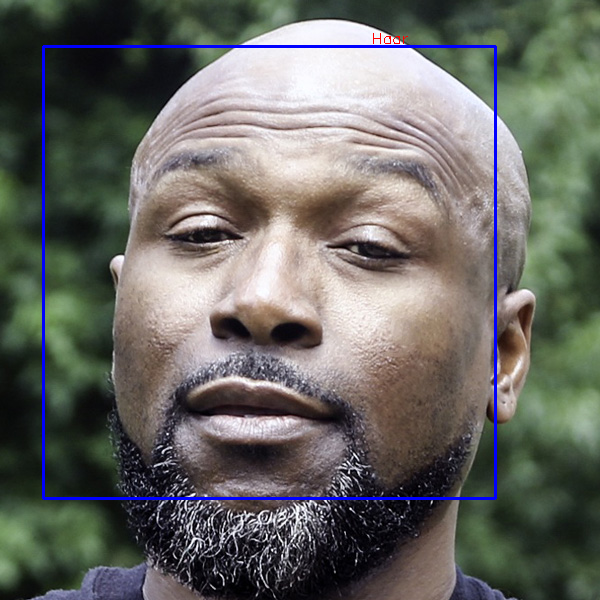

### Correctly detected face

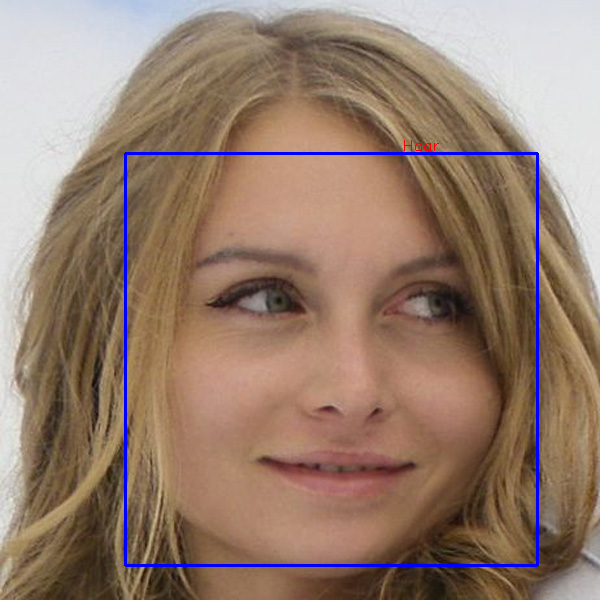

In [16]:
display(Markdown("### Correctly detected face"))
Bounding_box(haar_img_box_df,"/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00022.jpg",title="Haar")
display(Markdown("### Correctly detected face"))
Bounding_box(haar_img_box_df,"/content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01009.jpg",title="Haar")

Displaying all the faces that were not detected by HAAR Model

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00623.jpg

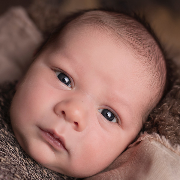

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00652.jpg

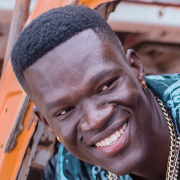

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00077.jpg

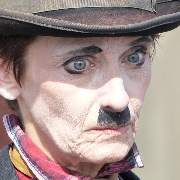

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00686.jpg

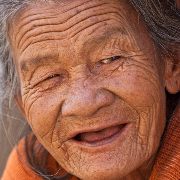

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01047.jpg

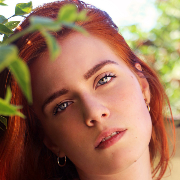

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00921.jpg

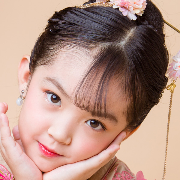

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00070.jpg

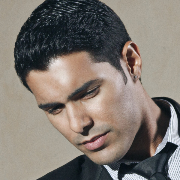

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00118.jpg

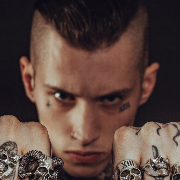

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00319.jpg

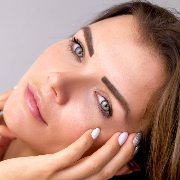

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00628.jpg

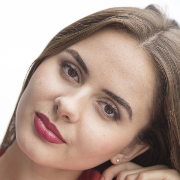

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00247.jpg

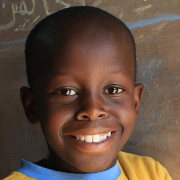

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00691.jpg

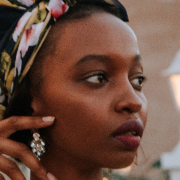

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00969.jpg

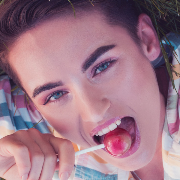

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00522.jpg

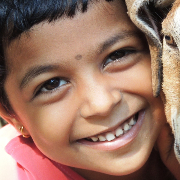

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00630.jpg

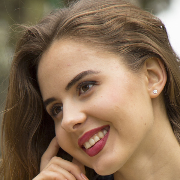

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00877.jpg

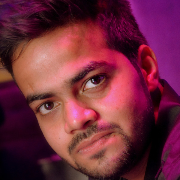

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00009.jpg

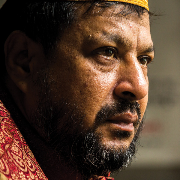

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00463.jpg

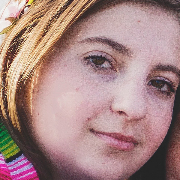

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00389.jpg

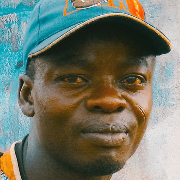

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00320.jpg

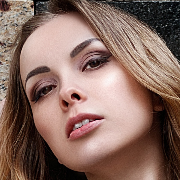

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00971.jpg

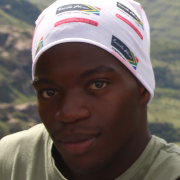

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00613.jpg

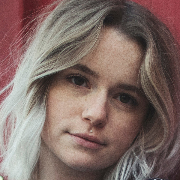

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00162.jpg

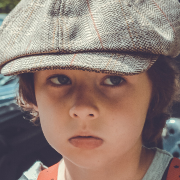

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00240.jpg

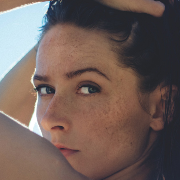

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00797.jpg

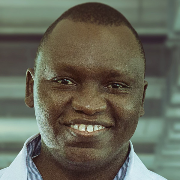

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00904.jpg

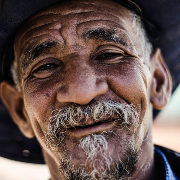

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00962.jpg

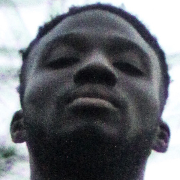

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00466.jpg

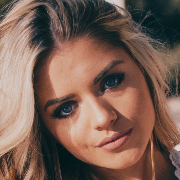

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00511.jpg

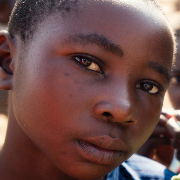

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00029.jpg

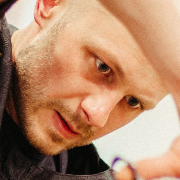

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00039.jpg

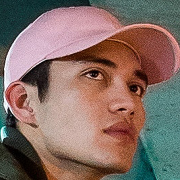

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00697.jpg

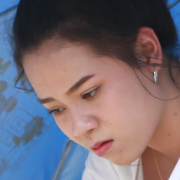

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00942.jpg

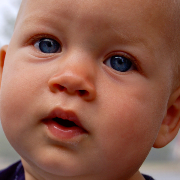

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00402.jpg

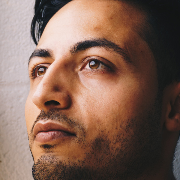

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00369.jpg

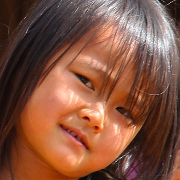

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00692.jpg

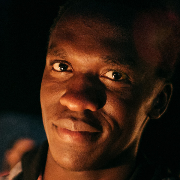

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00544.jpg

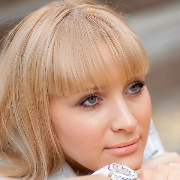

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00374.jpg

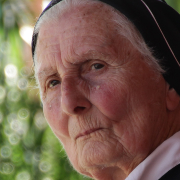

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00608.jpg

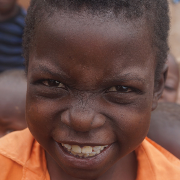

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00935.jpg

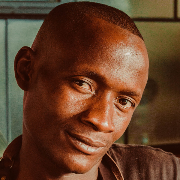

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00607.jpg

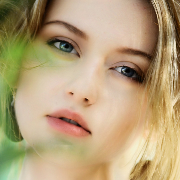

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00627.jpg

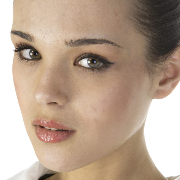

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00917.jpg

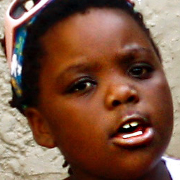

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00632.jpg

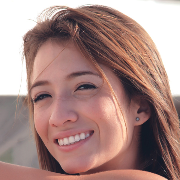

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00772.jpg

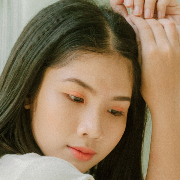

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00339.jpg

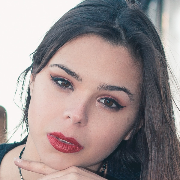

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00282.jpg

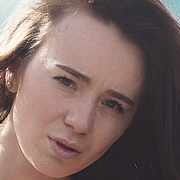

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00217.jpg

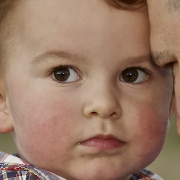

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00309.jpg

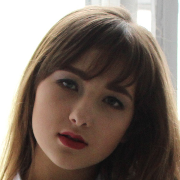

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00091.jpg

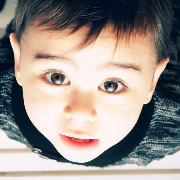

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00722.jpg

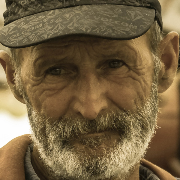

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00275.jpg

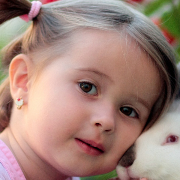

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00671.jpg

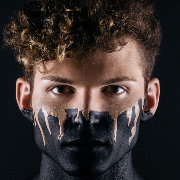

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00056.jpg

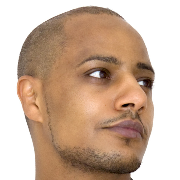

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01005.jpg

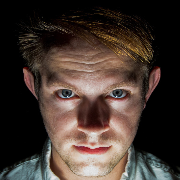

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00661.jpg

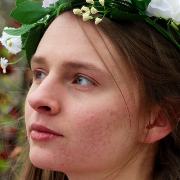

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00538.jpg

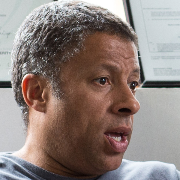

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00536.jpg

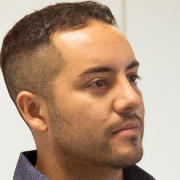

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00105.jpg

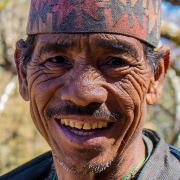

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00910.jpg

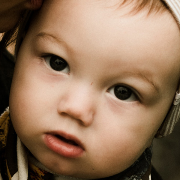

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00990.jpg

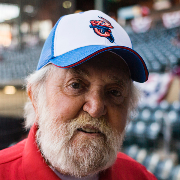

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00007.jpg

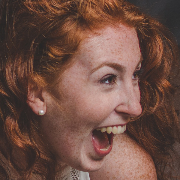

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00433.jpg

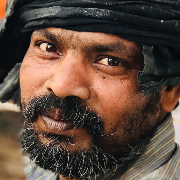

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00147.jpg

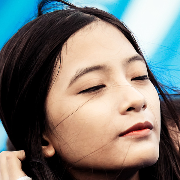

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00705.jpg

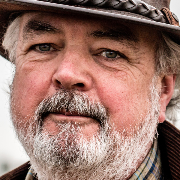

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00602.jpg

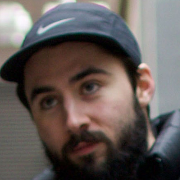

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00853.jpg

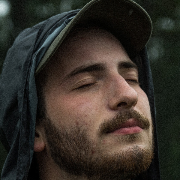

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00323.jpg

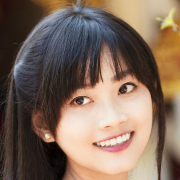

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00215.jpg

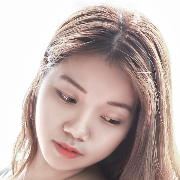

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00269.jpg

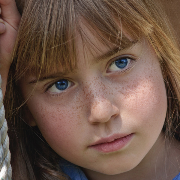

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00609.jpg

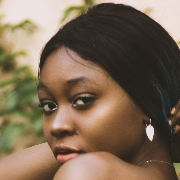

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00951.jpg

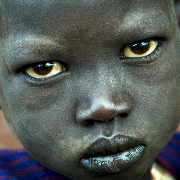

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00484.jpg

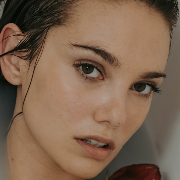

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00611.jpg

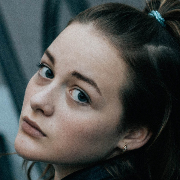

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00005.jpg

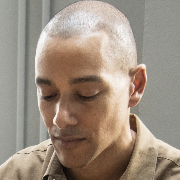

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00223.jpg

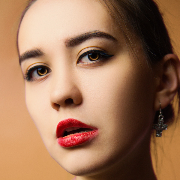

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00793.jpg

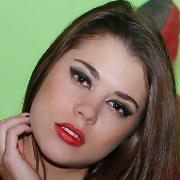

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00875.jpg

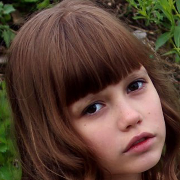

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00788.jpg

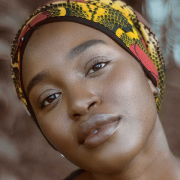

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00228.jpg

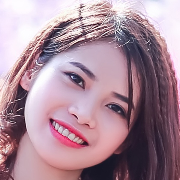

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00384.jpg

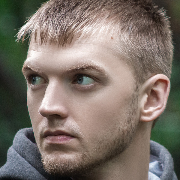

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00912.jpg

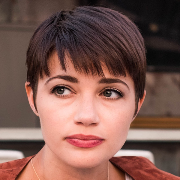

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00341.jpg

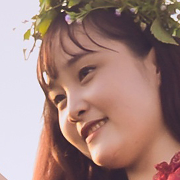

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00984.jpg

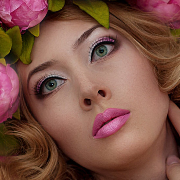

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00146.jpg

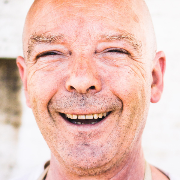

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01035.jpg

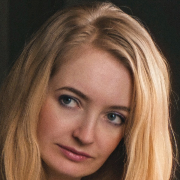

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00890.jpg

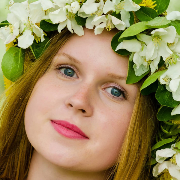

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00202.jpg

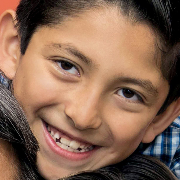

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00148.jpg

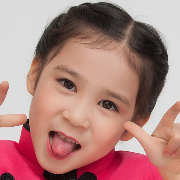

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00366.jpg

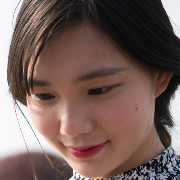

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00099.jpg

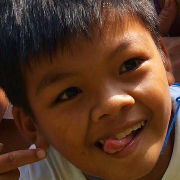

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00224.jpg

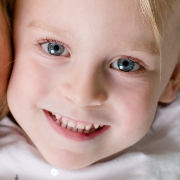

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00280.jpg

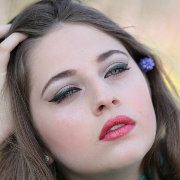

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00316.jpg

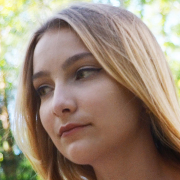

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00888.jpg

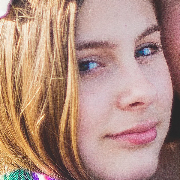

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00155.jpg

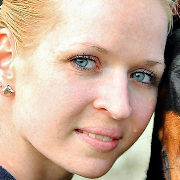

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00066.jpg

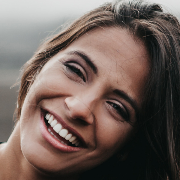

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01025.jpg

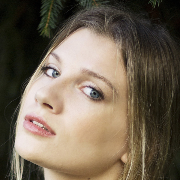

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00098.jpg

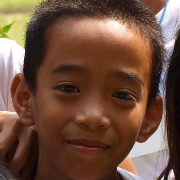

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00335.jpg

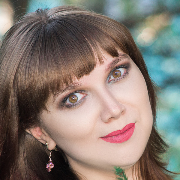

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00818.jpg

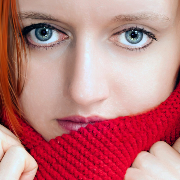

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00327.jpg

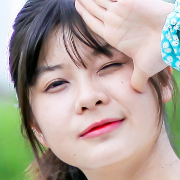

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00318.jpg

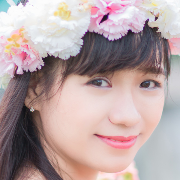

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01052.jpg

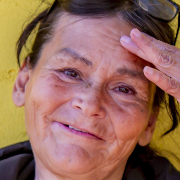

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00435.jpg

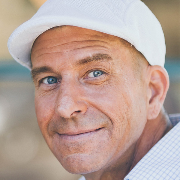

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00560.jpg

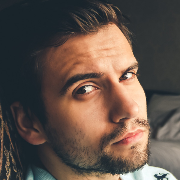

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00729.jpg

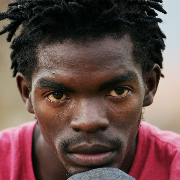

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00800.jpg

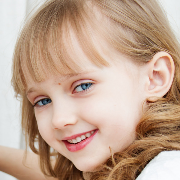

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00016.jpg

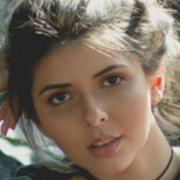

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00970.jpg

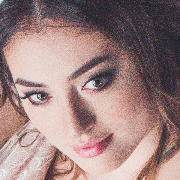

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00852.jpg

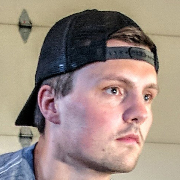

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00081.jpg

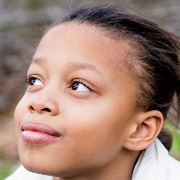

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00514.jpg

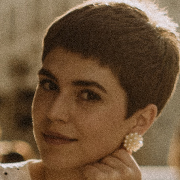

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00872.jpg

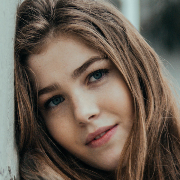

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00199.jpg

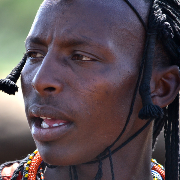

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00655.jpg

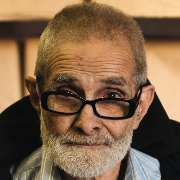

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00510.jpg

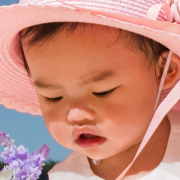

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00851.jpg

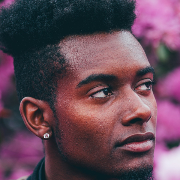

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01034.jpg

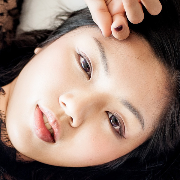

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00013.jpg

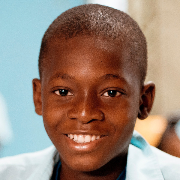

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00326.jpg

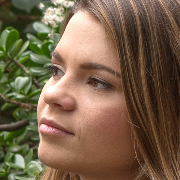

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00018.jpg

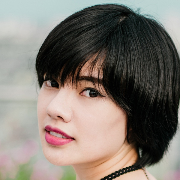

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00034.jpg

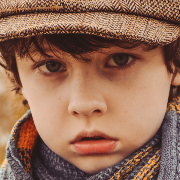

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00957.jpg

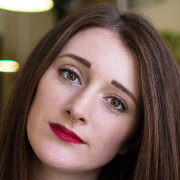

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01054.jpg

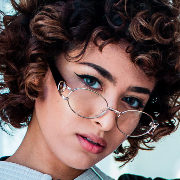

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00723.jpg

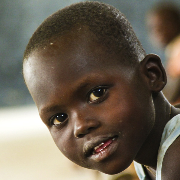

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00338.jpg

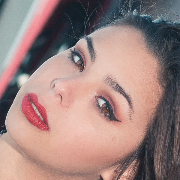

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00746.jpg

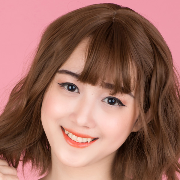

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00198.jpg

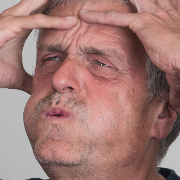

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00488.jpg

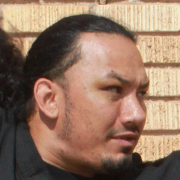

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00683.jpg

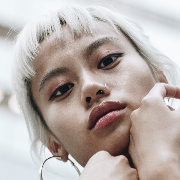

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00742.jpg

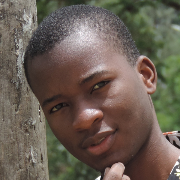

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00318(1).jpg

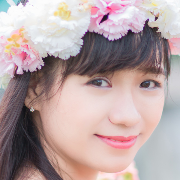

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00870.jpg

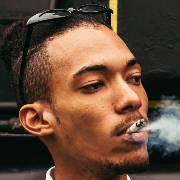

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00807.jpg

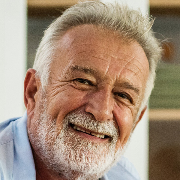

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00762.jpg

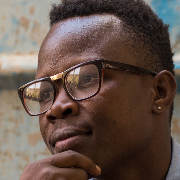

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00700.jpg

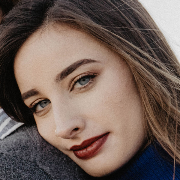

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00775.jpg

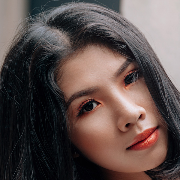

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00097.jpg

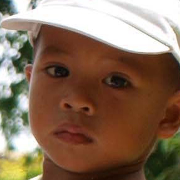

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00529.jpg

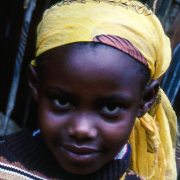

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01014.jpg

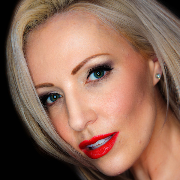

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00493.jpg

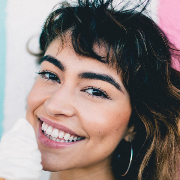

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00519.jpg

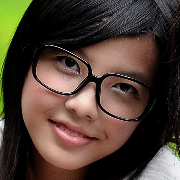

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00319(1).jpg

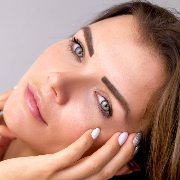

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00857.jpg

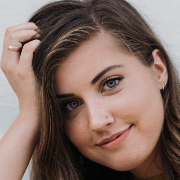

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00884.jpg

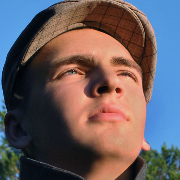

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00443.jpg

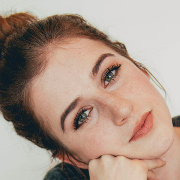

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00086.jpg

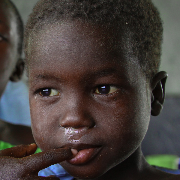

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00020.jpg

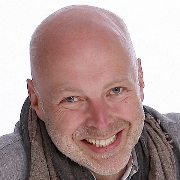

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00064.jpg

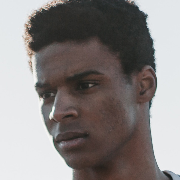

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00580.jpg

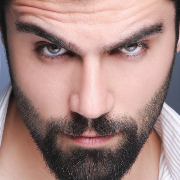

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00250.jpg

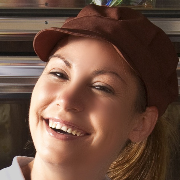

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00350.jpg

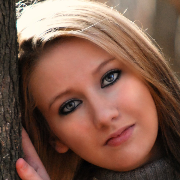

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00364.jpg

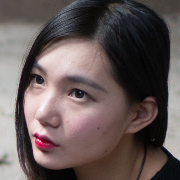

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00897.jpg

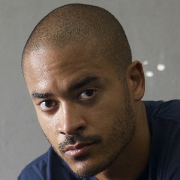

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00946.jpg

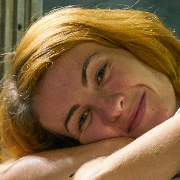

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00259.jpg

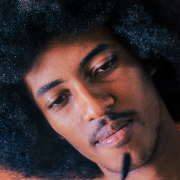

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_01081.jpg

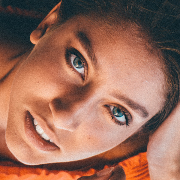

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00072.jpg

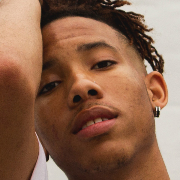

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00798.jpg

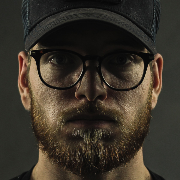

#### /content/drive/MyDrive/face detection of cast/Part 2 - training images/training_images/real_00288.jpg

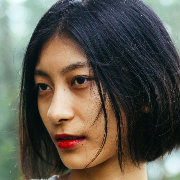

In [17]:
haar_set = set(haar_undetected_images)
show_face(haar_set,0.3)

Observation:

There are images where a face could not be detected due to:

Face partailly covered

Face zoomed such that it crops part of the face

Poor illumination or partially lit surfaces on the face

Tilted face

Side face